# 12/5/24 VQ-VAE
- VQ-VAE with standard loss objective (From first-paper)
-  residual convolutional (convnet) blocks and kaiming-he initialization
- Pretty small network with only a few blocks.

Did not train :( (turned off after half way through).
Make way to save intermediate progress.

In [1]:
#empty

# 12/6/24 VQ-VAE
- Same archticture; naive layer-init (kaiming /default pytorch), ResBlocks with no attn, layers
- Beta parameter (to keep outputs close to codebooks) 0.25

### Loss: ~0.29

***The Neural Net didn't work :( (something wrong with loss?!?!)***

Will come back and diagnose issue.

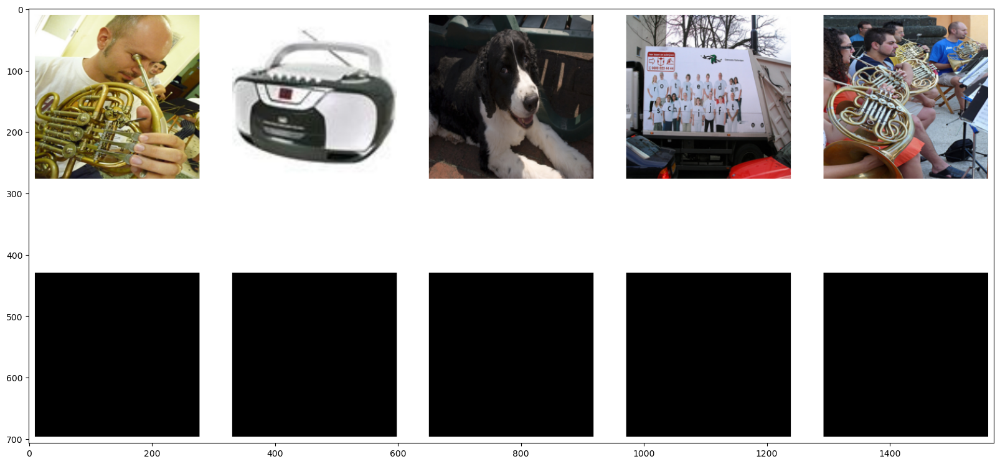

In [2]:
# showing results
import PIL.Image as Image
import matplotlib.pyplot as plt
fig = plt.figure()
fig.set_size_inches(20,20)
img = Image.open('pics/1.png')
plt.imshow(img)

# 12/7/24

Again, I maded a last minute change to my residual blocks, this may have been the error (as it was training fine before):
- norm
- conv 
- non-linearity
- residual connection

should I have initialized the conv-weights differently?

I will learn more about NN stability and training today, and hopefuly I gain insight into the issue!

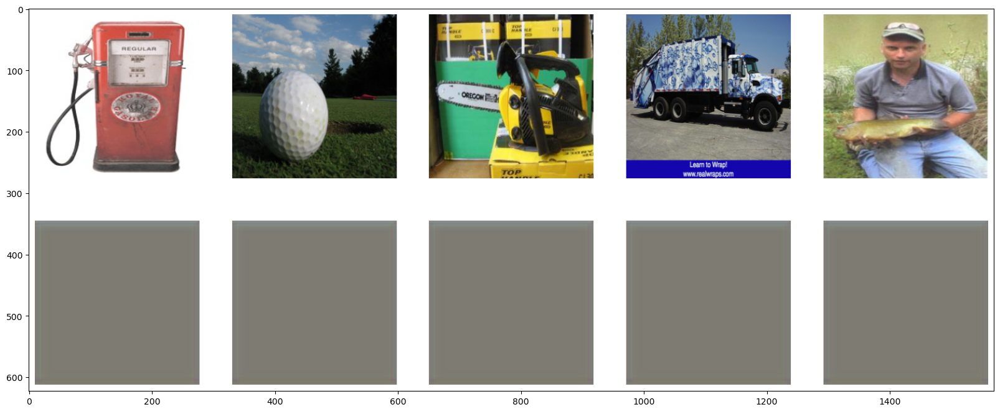

In [3]:
img = Image.open('pics/2.png')
fig = plt.figure()
fig.set_size_inches(20,20)
plt.imshow(img)

# 12/8/24 
I trained a diffusion transformer that I've been building, and unfortunately, it went very poorly. 

Something made it not be able to learn past a very small amount (from 500->27k iters).

I will come back and hopefully have diagnosed the problem! I really am not sure what the problem could be currently.

# 12/9/24

I tried to train a VQ-VAE again... I followed the exact architecture from the original paper, but for some reason the training went very poorly. 

- The neural net. learned very fast and then after a few epochs, the loss just jumped back to the initial loss. 

I need to build some features so I can diagnose the training better. And I suspect weight init could have been a problem...

In [4]:
img = Image.open('pics/12_9_24.png')
fig = plt.figure()
fig.set_size_inches(20,20)
plt.imshow(img)

Error in callback <function flush_figures at 0x000001394DF99620> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

12/10/24 VQ-VAE

In this expiriment/training run, I implemented clip-gradients which temporarily solved the exploding-gradient problem. And when the network ran for long enough, it trained pretty well!.

However, this is a janky solution, and other methods like normalization and init. need to be used to make traninig stable...

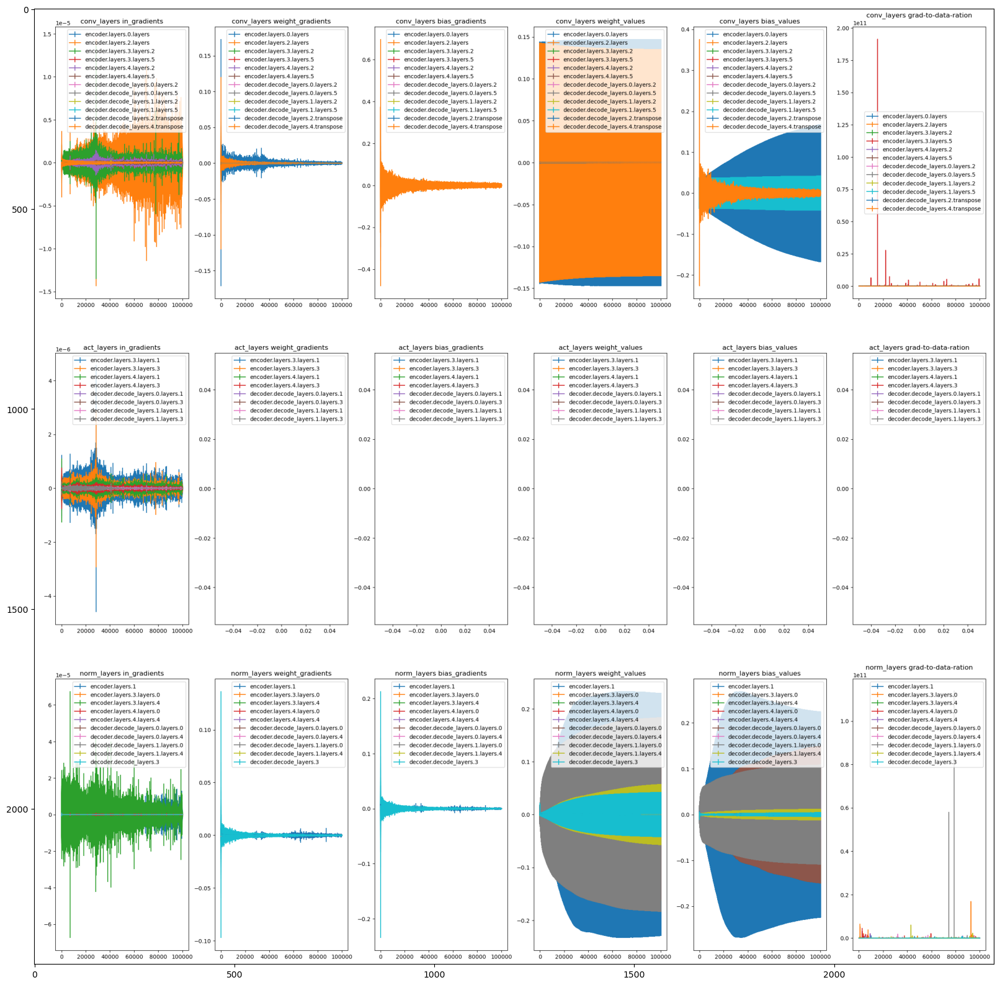

In [6]:
# training-run
img = Image.open('pics/12_10_24.png')
fig = plt.figure()
fig.set_size_inches(20,20)
plt.imshow(img)

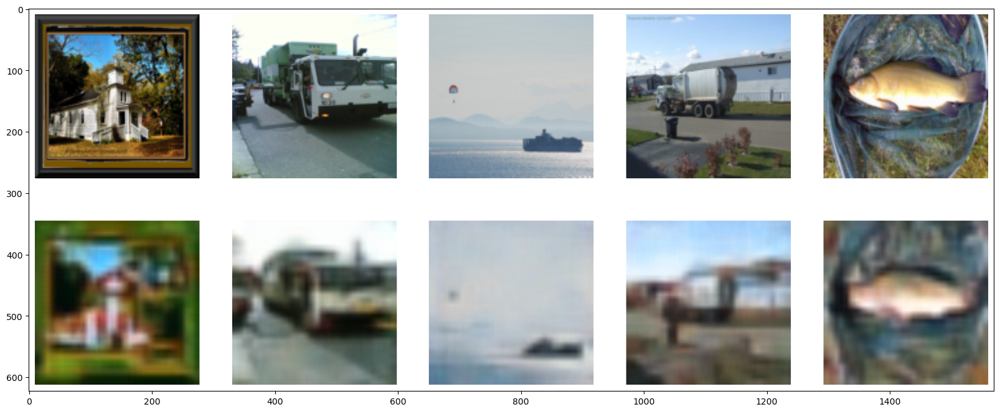

In [7]:
# results
img = Image.open('pics/12_10_24r.png')
fig = plt.figure()
fig.set_size_inches(20,20)
plt.imshow(img)

# 12/11/24 More VQ-VAE

Trained the VQ-VAE further, no noticable difference, and its been enough epochs that i think the model itself is likely limited (maybe because norm?)

here is the result:

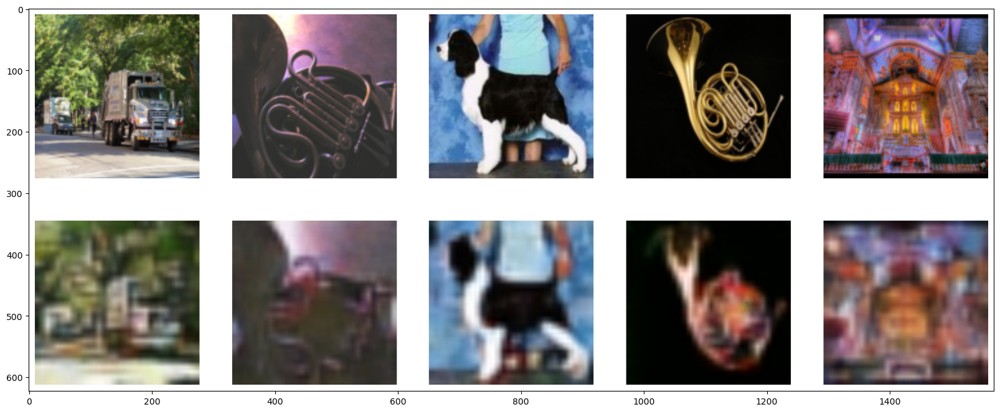

In [8]:
# results
img = Image.open('pics/12_11_24.png')
fig = plt.figure()
fig.set_size_inches(20,20)
plt.imshow(img)

> IMPORTANT: I only trained by network on CIFAR-10 images, and it did very well on them! However, these are imagenette higher-res images, so it makes sense my model does poorly with them!

Eventually would like to fully understand layer init. techniques and build a nn with no need for grad. clipping.

Here is the model simply fine tuned for a few epochs on the imagenette set; it clearly does better:

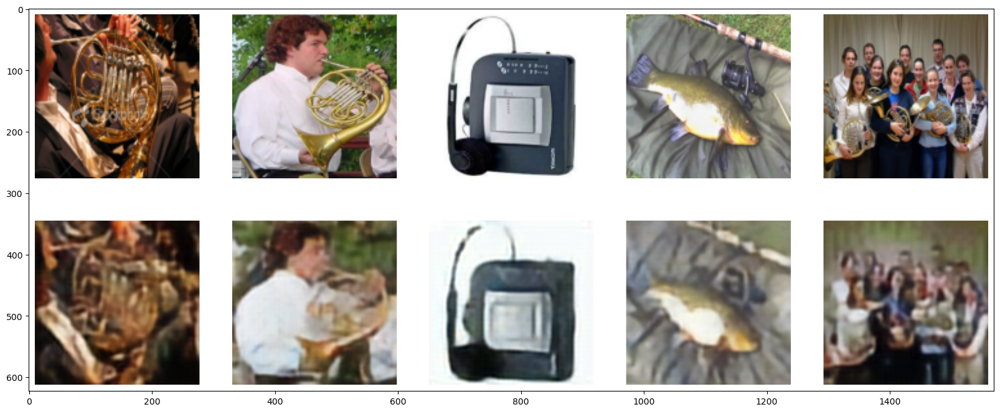

In [9]:
# fine tuning
img = Image.open('pics/12_11_24ft.png')
fig = plt.figure()
fig.set_size_inches(20,20)
plt.imshow(img)

However, next time we'll train it from scratch on this more high-res dataset!

Interestingly though, it took more time to train it on this more high-res dataset even though there were the same number of pixels (and presumably computations in the neural net?)

# 12/13/24

Trained diffusion-model, loss plataued; not sure whether due to loss objective being wrong (error in code), or fundamental lack of depth/representational capacity of model...

# 12/14/24
Trained VQ-VAE again; for around 100k epochs, it really is preforming the same as originally. Now, it's time to put modifications on it's original archticture and see how it traings.

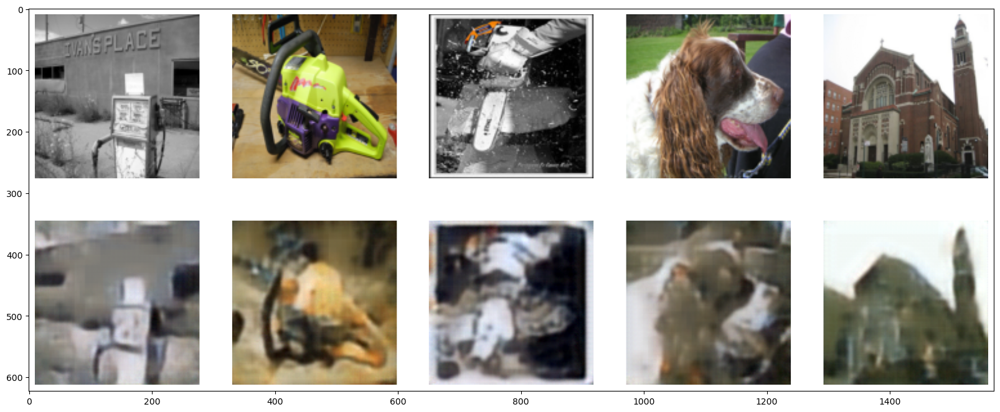

In [10]:
# fine tuning
img = Image.open('pics/12_14_24.png')
fig = plt.figure()
fig.set_size_inches(20,20)
plt.imshow(img)

# 12/15/24 DiT

I trained a latent-space transformer diffusion model, and clearly the model did something, but it did not capture the dataset effectively as can be seen with the image below.

It either:
1. Didn't train because of a bad loss objective/ poor model representational capacity/training ability
2. DDIM inference process was somehow wrong
3. DDPM (noising process) wrong (doubtful)

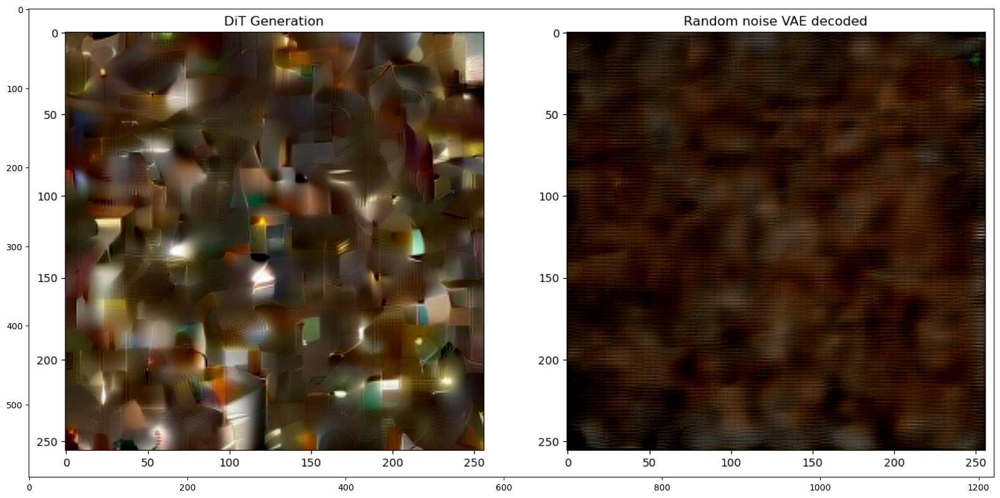

In [11]:
# fine tuning
img = Image.open('pics/12_15_24.png')
fig = plt.figure()
fig.set_size_inches(20,20)
plt.imshow(img)

# 12/16/24 DiT training
- 200k epochs, 0.3 loss
This time, I added class-conditioning. The model learned better, and is now able to understand very, very general patterns like overall color and background present in different classes, however it is still poor; the patches have very little coherence. I am not sure whether it needs more training, or the model is fundamentally handicapped for some reason:

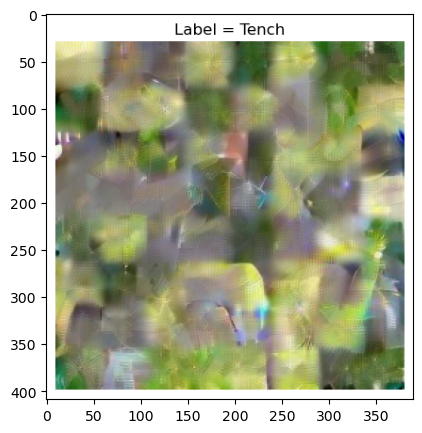

In [5]:
# 50 DDIM inference steps
from PIL import Image
import matplotlib.pyplot as plt
img = Image.open('pics/12_16_24.png')
fig = plt.figure()
fig.set_size_inches(5,5)
plt.imshow(img)


Although it may just need more training, as the authors of the original paper got similar results for the smaller-models (but after 400k epochs).

Also, I have yet to predict (or understand why we would need to) the covariance-matrix, which has been shown to increase sample-quality (especially during accelerated sampling).

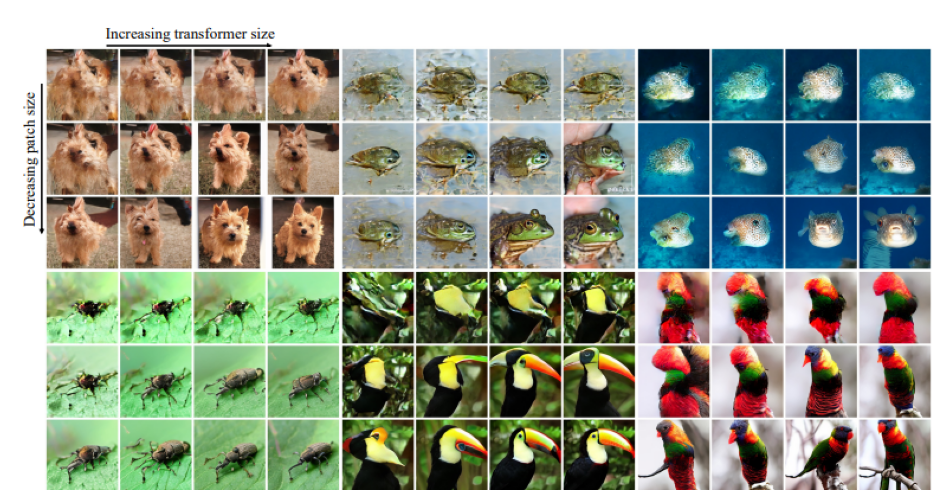

In [10]:
from PIL import Image
import matplotlib.pyplot as plt
img = Image.open('pics/12_16_24comp.png')
fig = plt.figure()
fig.set_size_inches(12,12)
plt.axis('off')
plt.imshow(img)

# 12/17/24 DiT training

- 200k epochs, 0.4 loss w/hybrid
- Added covariance prediction (although the inference is definitely wrong!)

For some reason, it seems the AdaLN params (like classes), aren't actually doing much. It may now help to study the gradients/values of specific modules/params, and have a way to track them over-time.

Furthermore, I need to fix the broken inference problem, and train the model more! 

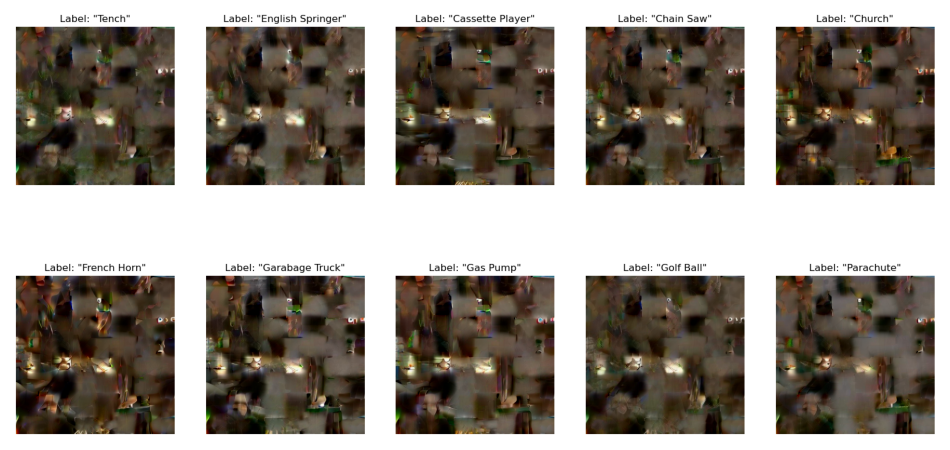

In [1]:
from PIL import Image
import matplotlib.pyplot as plt
img = Image.open('pics/12_17_24.png')
fig = plt.figure()
fig.set_size_inches(12,12)
plt.axis('off')
plt.imshow(img)

# 12/18/24 More DiT

Very dissapoitingly, the DiT is still converging to a very low loss (0.4 after around ~300k epchs). The gradients are relatively stable, and the model really should be learning. 

Here are potential problems:
- Error in patch/de-patch embedding!
- Error in DDPM/noising formulation.
- Self-attn error in base-model

I will look over the model and try to understand where the error is. Something I should have been doing is testing the depatchify to see if it can take-apart/rebuild an image in a notebook.

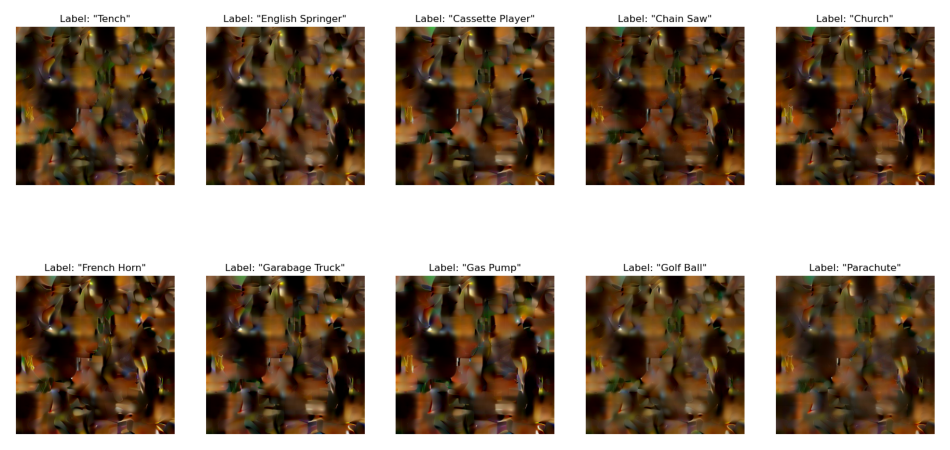

In [1]:
from PIL import Image
import matplotlib.pyplot as plt
img = Image.open('pics/12_18_24.png')
fig = plt.figure()
fig.set_size_inches(12,12)
plt.axis('off')
plt.imshow(img)

# 12/20/24 DiT

The models capacity is fundamentally limited by something, I beleive. I was not able to change it, because I am working on my website, however, I will preform some expiriments with my model, such as testing the depatchify/patchify to reconstruct images, making sure the VAE is working, and making sure (most importantly) the DDIM/DDPM inference matches (this part is most finicky).

Then, I will compare the DiT with other diffusion/generative image models, and really try to understand the differences; but having it *actually working* is a good first step!

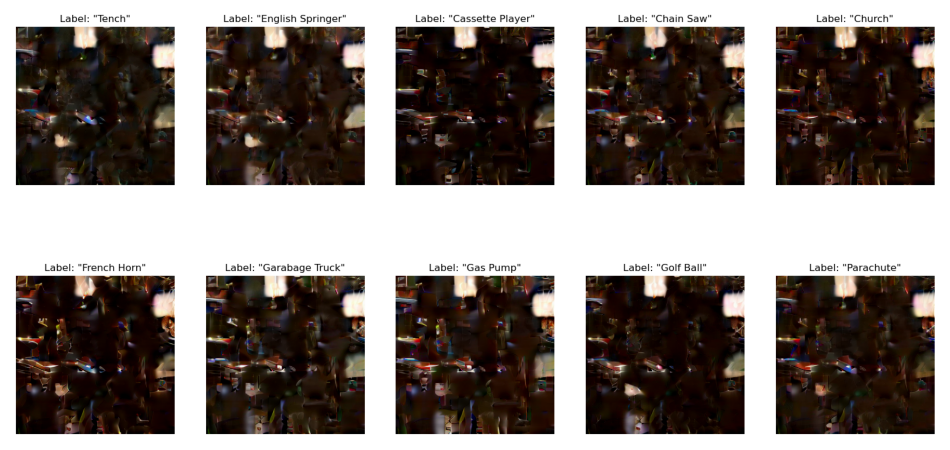

In [1]:
from PIL import Image
import matplotlib.pyplot as plt
img = Image.open('pics/12_19_24.png')
fig = plt.figure()
fig.set_size_inches(12,12)
plt.axis('off')
plt.imshow(img)

# 12/20/24 VQ-VAE

More training of my VQ-VAE because no other network to train, here are the results after ~120k epochs and 0.6 loss:

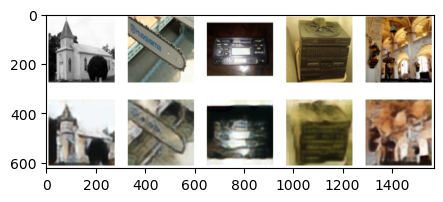

In [1]:
from PIL import Image
import matplotlib.pyplot as plt
img = Image.open('pics/12_20_24.png')
fig = plt.figure()
fig.set_size_inches(5,5)
plt.imshow(img)

# 12/21/24 DiT

This time, I took some things away from the DiT and it actually trained faster. It acheived ~20% better log los (0.4) when I took out one of the linear-layers of the adaln class/time projection...

This leads me to beleve something is wrong with our model (clearly), or at least beforehand we hadn't been triaining it right...



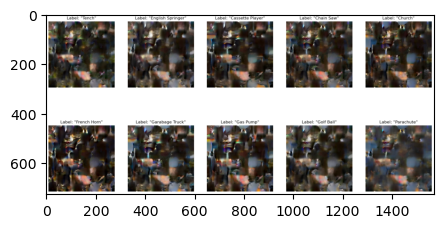

In [2]:
from PIL import Image
import matplotlib.pyplot as plt
img = Image.open('pics/12_21_24.png')
fig = plt.figure()
fig.set_size_inches(5,5)
plt.imshow(img)

# 12/22/24 DiT

Training DiT again; haven't fixed model yet! (but varied beta-schedule).

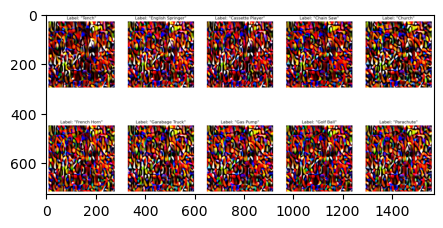

In [2]:
from PIL import Image
import matplotlib.pyplot as plt
img = Image.open('pics/12_22_24.png')
fig = plt.figure()
fig.set_size_inches(5,5)
plt.imshow(img)

The differences in output (much more colorful!) make me think something is wrong with the inference...

# 12/23/24 VQ-VAE

Interesting how when I trained on one dataset (higher-res), and then 'finetuned' on another, the model did so much more well. There is an intuition for this im sure, and it clearly works, but I lack a good explanation for why the gradients are so-similar for similar tasks...

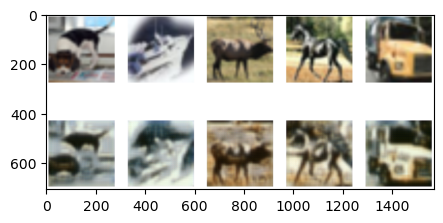

In [7]:
from PIL import Image
import matplotlib.pyplot as plt
img = Image.open('pics/12_23_24.png')
fig = plt.figure()
fig.set_size_inches(5,5)
plt.imshow(img)

# 12/24/24 DiT

Tried training the DiT with a different beta-scheduler (linear), this leads me to beelive that the formulation of the DDIM is fundamentally wrong. I need to rebuild this model/come back to the formulation; or at least fix it:

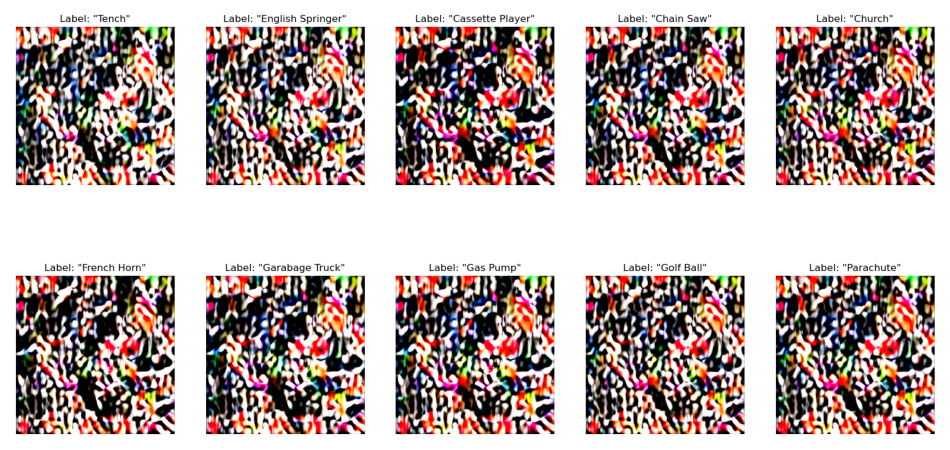

In [3]:
from PIL import Image
import matplotlib.pyplot as plt
img = Image.open('pics/12_24_24.png')
fig = plt.figure()
fig.set_size_inches(12,12)
plt.axis('off')
plt.imshow(img)

# 12/26/24 VQ-VAE

If you couldn't tell, I haven't been designing any neural net. architectures recently. I have found some other technology-related projects I'm interested in, but I will inevitably be back soon to learning about deep learning, and finding cool things to share/cool-projects!

VQ-VAE reconstructions:

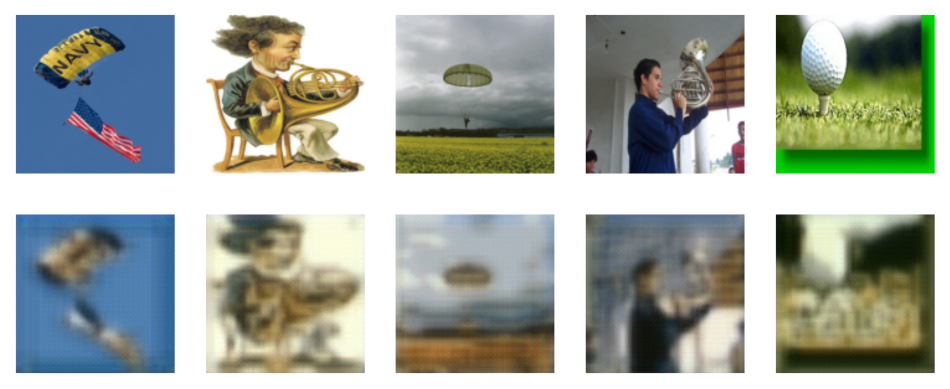

In [1]:
from PIL import Image
import matplotlib.pyplot as plt
img = Image.open('pics/12_25_24.png')
fig = plt.figure()
fig.set_size_inches(12,12)
plt.axis('off')
plt.imshow(img)

# 12/26/24

Nothing meaningful to show, as I am now working on another, hardware project. This still will involve deep thinking, and learning, and I will inevitably return to neural nets!

I don't see benefit now in training the same model over and over, so I will be back when there are some meaningful projects I wish to pursue here.

I would like to start learning some circutry/robotics and build a drone from scratch! Also maybe some other cool physics/robotics. Later, I will write down learning experiences I've had: